Welcome to Tutorial 5! Our last kick at the can together before we head off to the wild world - hopefully with a few more image analytics tools in our toolbelt. 

Here will be covering some of the machine learning tools avilable to us though libraries such as [scikit learn](https://scikit-learn.org/stable/). 

Learning about machine learning! How ironic!

Lets jump right in! 

#Machine Learning and Labelled Data

To experiment with machine learning, were going to need some data! A classic imagery dataset for machine learning tutorials is the [MNIST dataset](http://yann.lecun.com/exdb/mnist/) of hand written characters - it has what you need - very large amounts of image data which are 'labelled' in some consistent way. In the case of MNIST - we have 70,000 images of hand written letters of the alphabet labelled by the letter in the image. This type of data allows up to deploy from the *vast* catalogue of machine learning tools to tackle the challenging task of connecting the data in the image to the information in the label. Effectively - the machine 'learns' what it is about the image of a 'K' that makes it a 'K'. So we need labeled data. We *could* label data ourselves... (if you like circling of things...). Thankfully there are [loads of pre-labelled example datasets to choose from](https://en.wikipedia.org/wiki/List_of_datasets_for_machine-learning_research). In terms of geospatial data there are [a fair bit of great sources of labelled data](https://github.com/chrieke/awesome-satellite-imagery-datasets). But in all cases, whatever data we choose, we will have to (1) access it, (2) learn its structure, and (3) format it to fit the input of our machine learning tool of choice... So lets do that! 

#Accessing some data

After snooping around a bit, ive settled on having a look at the aerial image dataset made avilable from the [DroneDeploy Machine Learning Segmentation Benchmark](https://github.com/dronedeploy/dd-ml-segmentation-benchmark). This dataset includes both a sample dataset (3 images, 0.5 GB) and a larger dataset (9.0 GB) - both containing a set of orthographic drone images, elevation models, and labels. Having a sample version of the dataset is great as it lets us download only a small peice and play around before attempting to deploy anything we're doing on the larger dataset. 

So lets go ahead and pull down the sample dataset, this is done by hitting the url found in the git with the linux command **wget**

In [1]:
!wget https://dl.dropboxusercontent.com/s/h8a8kev0rktf4kq/dataset-sample.tar.gz

--2020-05-06 21:04:51--  https://dl.dropboxusercontent.com/s/h8a8kev0rktf4kq/dataset-sample.tar.gz
Resolving dl.dropboxusercontent.com (dl.dropboxusercontent.com)... 162.125.8.6, 2620:100:601b:6::a27d:806
Connecting to dl.dropboxusercontent.com (dl.dropboxusercontent.com)|162.125.8.6|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 418980035 (400M) [application/octet-stream]
Saving to: ‘dataset-sample.tar.gz’

dataset-sample.tar. 100%[===================>] 399.57M  49.5MB/s    in 8.5s    

2020-05-06 21:05:00 (47.3 MB/s) - ‘dataset-sample.tar.gz’ saved [418980035/418980035]



This was dropped our current working directory - the default content directory of google colab. We can see a list of files using the linux command **ls**

In [2]:
%ls

dataset-sample.tar.gz  sample_data/


The file we downloaded is a *compressed tar* file - its a linux style way of packing a folder up to be shipped across the internet using less storage space. We can unpack it using the **tar** command along with a [few arguments](https://www.cyberciti.biz/faq/tar-extract-linux/)...

In [4]:
!tar -xzvf dataset-sample.tar.gz

dataset-sample/
dataset-sample/elevations/
dataset-sample/elevations/e1d3e6f6ba_B4DE0FB544INSPIRE-elev.tif
dataset-sample/elevations/ec09336a6f_06BA0AF311OPENPIPELINE-elev.tif
dataset-sample/elevations/1d4fbe33f3_F1BE1D4184INSPIRE-elev.tif
dataset-sample/images/
dataset-sample/images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
dataset-sample/images/ec09336a6f_06BA0AF311OPENPIPELINE-ortho.tif
dataset-sample/images/e1d3e6f6ba_B4DE0FB544INSPIRE-ortho.tif
dataset-sample/index.csv
dataset-sample/labels/
dataset-sample/labels/ec09336a6f_06BA0AF311OPENPIPELINE-label.png
dataset-sample/labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png
dataset-sample/labels/e1d3e6f6ba_B4DE0FB544INSPIRE-label.png


Great, lets see what is in our working directory now

In [14]:
%ls

dataset-sample/  dataset-sample.tar.gz  sample_data/


We see a new folder called dataset-sample... lets move our working directory into that folder using the **cd** command.

*Note: that OTHER directory, sample_data/ actually contains our friend the MNIST dataset! Google colab has it by default as it is used in may of the [google colab tensorflow examples](https://www.tensorflow.org/quantum/tutorials/mnist)...*

In [15]:
%cd dataset-sample/

/content/dataset-sample


Ok! So now were hanging out with the data we downloaded. To recursively list all the contents of this directory, lets use the **find** command with a single period as an argument...

*note: the fact that we are jumping back and forth putting a % or a ! in front of our commands has to do with requirements of google colab, not the syntax of the underlaying linux commands*

In [16]:
!find .

.
./elevations
./elevations/e1d3e6f6ba_B4DE0FB544INSPIRE-elev.tif
./elevations/1d4fbe33f3_F1BE1D4184INSPIRE-elev.tif
./elevations/ec09336a6f_06BA0AF311OPENPIPELINE-elev.tif
./index.csv
./images
./images/ec09336a6f_06BA0AF311OPENPIPELINE-ortho.tif
./images/e1d3e6f6ba_B4DE0FB544INSPIRE-ortho.tif
./images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
./labels
./labels/ec09336a6f_06BA0AF311OPENPIPELINE-label.png
./labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png
./labels/e1d3e6f6ba_B4DE0FB544INSPIRE-label.png


Great! Now we've had a look at the structure of the files as they have been unpacked. 

# Exploring the Data

Even though this is a small sample of the data - it maybe wise to use pandas to build a dataframe representing the files for help in organizing and accessing the data programmatically. As we have in pervious tutorials - lets use pandas to build a dataframe from that *./index.csv* file there... (I did do sone snooping and the information in the csv is sperated by spaces)

In [0]:
import pandas as pd
imageInfo = pd.read_csv('index.csv', sep=' ') # we can set the space ' ' as the seperation

Lets check the size our new dataframe *imageInfo* generated from the csv

In [96]:
imageInfo.shape

(3, 12)

Great now lets print the information contained in the dataframe ...

In [25]:
print(imageInfo)

  status                               name  ...  percentage_car  percentage_ignore
0   GOOD       1d4fbe33f3_F1BE1D4184INSPIRE  ...            0.09              18.08
1   GOOD       e1d3e6f6ba_B4DE0FB544INSPIRE  ...            0.12              46.47
2   GOOD  ec09336a6f_06BA0AF311OPENPIPELINE  ...            0.17              31.71

[3 rows x 12 columns]


Ah, now we can see the three image sets but not all the 12 columns of metadata. By default, the print option for pandas dataframes is pretty limited. the '...' indecates that some information has been passed over to fit into the default maximum width of the print out. This is a wise default as dataframes can get *very* big and printing them out in their entirety may not be sensible.

But - we know this is a small subset of the larger dataset - so lets adjust some options to get the full print out. 

In [50]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
pd.options.display.width= 1000

print(imageInfo)

  status                               name  rows  cols  visible_classes  percentage_building  percentage_clutter  percentage_vegetation  percentage_water  percentage_ground  percentage_car  percentage_ignore                                        path_images                                     path_elevation                                        path_labels
0   GOOD       1d4fbe33f3_F1BE1D4184INSPIRE  5542  2962                7                21.52                0.41                  15.42              1.63              42.85            0.09              18.08    ./images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif  ./elevations/1d4fbe33f3_F1BE1D4184INSPIRE-elev...    ./labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png
1   GOOD       e1d3e6f6ba_B4DE0FB544INSPIRE  8408  5924                7                 3.43                1.10                   4.44              1.51              42.94            0.12              46.47    ./images/e1d3e6f6ba_B4DE0FB544INSPIRE-ortho.tif  ./elevations/e1

Thats a little better - but again, we only have 3 image sets here.. so lets *transpose* the dataframe (flip the rows and columns) just for the print to fit the screen better. 

In [27]:
print(imageInfo.T)

                                                  0                             1                                  2
status                                         GOOD                          GOOD                               GOOD
name                   1d4fbe33f3_F1BE1D4184INSPIRE  e1d3e6f6ba_B4DE0FB544INSPIRE  ec09336a6f_06BA0AF311OPENPIPELINE
rows                                           5542                          8408                               4968
cols                                           2962                          5924                               7262
visible_classes                                   7                             7                                  6
percentage_building                           21.52                          3.43                               2.93
percentage_clutter                             0.41                           1.1                               1.29
percentage_vegetation                         15.42             

Ah very nice. We see that our image metadata contains an image name, a count of rows and columns, and some information on the classes present in the image labels. If we look back to the structure of our files, we see three sets of images contained in seperate folders. Lets append the information on these image paths to our dataframe...

In [97]:
''' we can set new columns in our dataframe directly with a string''' 

imageInfo['path_image'] = './images/'+imageInfo['name']+'-ortho.tif' #we reference the column 'name' and use it to build the path string
imageInfo['path_elevation'] = './elevations/'+imageInfo['name']+'-elev.tif'
imageInfo['path_label'] = './labels/'+imageInfo['name']+'-label.png'

print(imageInfo.T)

                                                                       0                                                  1                                                  2
status                                                              GOOD                                               GOOD                                               GOOD
name                                        1d4fbe33f3_F1BE1D4184INSPIRE                       e1d3e6f6ba_B4DE0FB544INSPIRE                  ec09336a6f_06BA0AF311OPENPIPELINE
rows                                                                5542                                               8408                                               4968
cols                                                                2962                                               5924                                               7262
visible_classes                                                        7                                                  7  

We can access information for a single image set by its index number in the dataframe using **iloc**. We can then get information such as image paths using the column name a multitide of ways. 

In [79]:
imageInfo0 = imageInfo.iloc[0]
print(imageInfo0['path_image'])
print(imageInfo.iloc[0].path_image)

print(imageInfo0['path_label'])
print(imageInfo.iloc[0].path_label)

./images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
./images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
./labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png
./labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png


When we need to, we loop though the rows of our dataframe and grab any data we need, for example, as such...

In [92]:
for index, row in imageInfo.iterrows():
  print(index, row[['name','visible_classes']])

0 name               1d4fbe33f3_F1BE1D4184INSPIRE
visible_classes                               7
Name: 0, dtype: object
1 name               e1d3e6f6ba_B4DE0FB544INSPIRE
visible_classes                               7
Name: 1, dtype: object
2 name               ec09336a6f_06BA0AF311OPENPIPELINE
visible_classes                                    6
Name: 2, dtype: object


Great! Now lets have a look at some of these images...
Here we will use the library [imageIO](https://imageio.readthedocs.io/en/stable/userapi.html) as it can open both tiff files and png.

Also, lets get a bit fancier with matplot lib than we have before and lets try [building a figure](https://matplotlib.org/3.1.1/gallery/subplots_axes_and_figures/figure_title.html) instead using subplots as we did before. Lets also [bump up the figure size](https://stackoverflow.com/questions/332289/how-do-you-change-the-size-of-figures-drawn-with-matplotlib) to get a better look at these images....


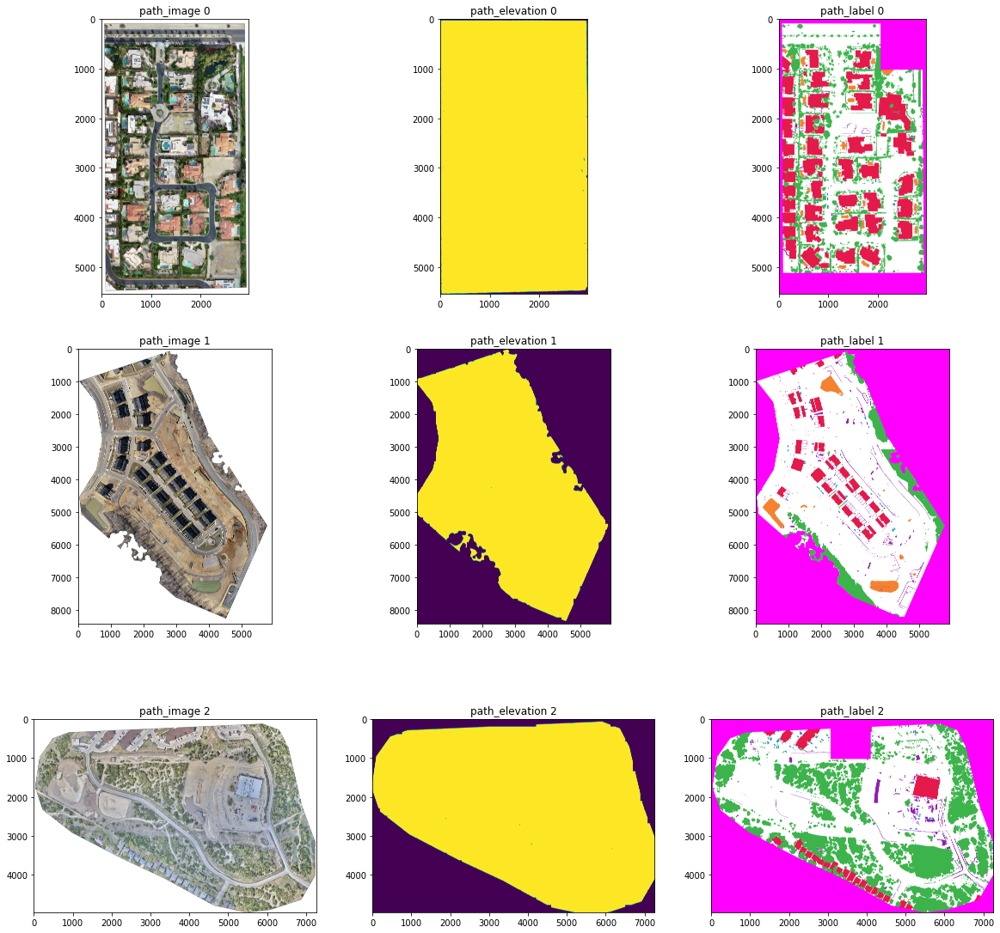

In [119]:
import imageio
from matplotlib import pyplot as plt

plt.rcParams['figure.figsize'] = [20, 20]

image_types = ['path_image','path_elevation','path_label']
image_type_count = len(image_types)
image_set_count = imageInfo.shape[0]

fig, axs = plt.subplots(image_set_count, image_type_count)
for index, row in imageInfo.iterrows():
  figure_column = 0
  for image_type in image_types:
    axs[index,figure_column].imshow(imageio.imread(row[image_type])) #load the entire image into the axis
    axs[index,figure_column].set_title(image_type+' '+str(index)) #set the title of the axis
    figure_column += 1


Great! So... we have 3 sets of 3 images of various sizes and shapes that look like ... those! The rgb ortho image looks rather beautiful. The elevation data... will need some further exploring. And the fact that the labels are appering in color directly from png may lead you to believe they are in RGBA format (uh oh). 

#Picking a machine learning model, GBDT

In scikit learn, there are a lot of very high quality and varied tools and approaches to tackling the general problem of connecting a set of 'answers' to a set of 'questions' (aka, machine learning). *I cant stress enough the appraochability and clearity of the scikit learn library. Take a look at their available [tools and reources](https://scikit-learn.org/stable/user_guide.html).*

The tool I would like to focus on in the  library is the popular and proven **[Gradient Boosted Decision Tree](https://scikit-learn.org/stable/modules/ensemble.html#gradient-boosting)** method (GBDT) - a more sphisticated variant on general [deceision tree](https://scikit-learn.org/stable/modules/tree.html) methods like random forest. In scikit learn, GBDT exists in two variants; (1) which can learn to *classify* based on a training set of labels, and (2) which can learn a complex *regression* function to mimic a training set of scalar values. To run the training - both variants expect **n** samples of target data (labels or scalars) as a 1-D numpy array as well as an **n** x [some number of features] 2-D numpy array of example data to train from which aling along one axis to the target data. 

Rmember - the tools are not specifically hard to *run* once the proper data preperation has been conducted. They are very well disigned and will try very hard to find an answer! The isses to be aware of come down to - which tool will work *better* and more *efficiently* - always with a compromose of *complexity* as in - how hard is it to setup. But also you should consider the risks of *over-fitting* the data - as in - performing *too* well in such manner that when you begin to apply your learned model on other example data - you don't get the results you expect due to even subtle differences in the new dataset. The moral of the story is ***lets try something!***

#Formatting the Data for Regression

Lets look specifically at the *regression* variant first. Lets pretend for a minuite that we only have RGB ortho images. We can actually use *just* these images too cook up a pretty captivating little tutorial on GBDT regression rather easily! 

So! Lets build a simple example where we pretend the 'blue' channel in our RGB image does not exist. It would look something like this... 




Text(0.5, 1.0, 'the blue channel alone')

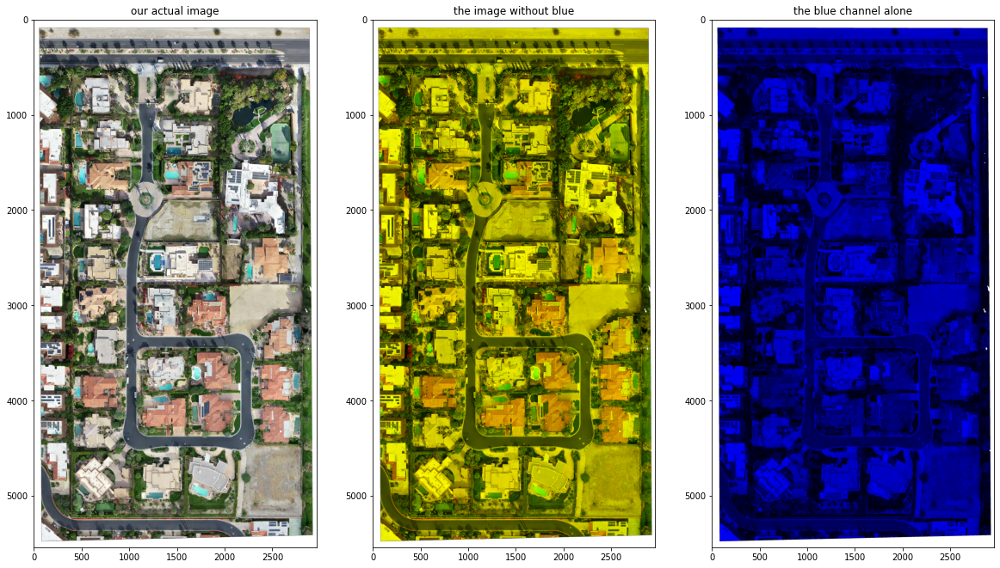

In [185]:

imageRGB = imageio.imread(imageInfo.iloc[0].path_image)
imageRG = imageRGB.copy()
imageRG[:,:,2] = 0 #setting blue to 0 to simulate no blue
imageB = imageRGB.copy()
imageB[:,:,0:2] = 0 #setting red and green to 0 to look at just blue

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGB);axs[0].set_title('our actual image')
axs[1].imshow(imageRG);axs[1].set_title('the image without blue')
axs[2].imshow(imageB);axs[2].set_title('the blue channel alone')

 We can compute a 'blue model' based of the red and green values in another image where 'blue' as the 1-D target array and 'red and green' are the 2-D array of attributes. With the model we can then compute a 'estimated' blue for the missing channel by applying a model to a simiar 2-D array of 'red and green' created from that image. 

Remember the inputs are simply a 2-D array of example data (where rows are some attribute of each example) and a 1-D array of targets values. Lets flatten the image! Lets give it a shot...

In [186]:
imageRGB = imageio.imread(imageInfo.iloc[0].path_image)
print(imageRGB.shape)
imageRGB_flat = imageRGB.reshape(-1, imageRGB.shape[-1])
print(imageRGB_flat.shape)

(5542, 2962, 4)
(16415404, 4)


Now we can see that we reshaped our array from 4 stacked 2-D channels (RGBA) to 4 stacked ginormously long 1-D channels. This is closer to the format which GBDT expects. We can now simply slice the 'red and green' into a 2-D attribute array and the 'blue' into a 1-D target array.


In [0]:
imageRG_flat = imageRGB_flat[:,0:2]
imageB_flat = imageRGB_flat[:,2]

Ok! Well - these models are good and fast and well built and all - but for the sake of speed. Lets use our old numpy array slicing trick to reduce the data down by a factor of 100 to speed up our model run - this reduction will kind of serve as our 'gas pedal' - but be warned if you go to fast (reduce the training data too much) bad things may happen! (not crash but.. bad results!) 

In [0]:
imageRG_flat_subsample = imageRG_flat[::100]
imageB_flat_subsample = imageB_flat[::100]

Lets take one last look at the size of our arrays, remember they should be 2-D (n*attributes) for example data and 1-D(n length) for target data.

In [189]:
print(imageRG_flat_subsample.shape)
print(imageB_flat_subsample.shape)

(164155, 2)
(164155,)


#Performing the Regression

Ok! Now lets feed them to the GBDT regression model! (hold your breath..)

*Note: there is some choice in the arguments for the [GradientBoostingRegressor](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingRegressor.html) which i encourage you to explore. Possibly the most important for our purposes are the n_estimators and the learning_rate, which related to the number of iterations and the amount of change per iteration respectively. Its essentially like.. distance and speed for a roadtrip - and the right answer (minimum error) is somwehere on that road... And you can miss it if you're going to fast!*


In [190]:
from sklearn.ensemble import GradientBoostingRegressor
blueModel = GradientBoostingRegressor(n_estimators=100, learning_rate=1,
                                      max_depth=1, random_state=0, loss='huber', verbose=1).fit(imageRG_flat_subsample, imageB_flat_subsample)

      Iter       Train Loss   Remaining Time 
         1         783.2377            6.72s
         2         555.6822            6.72s
         3         474.3631            6.77s
         4         386.4598            6.70s
         5         332.1460            6.62s
         6         309.2735            6.57s
         7         281.7053            6.52s
         8         266.1851            6.51s
         9         256.6886            6.48s
        10         245.0302            6.39s
        20         204.6582            5.67s
        30         186.5296            5.03s
        40         178.6180            4.33s
        50         171.8837            3.64s
        60         166.9794            2.92s
        70         163.8827            2.19s
        80         161.3088            1.47s
        90         159.4628            0.74s
       100         158.2026            0.00s


Wow! That was suspiciously fast!
Just as a quick check - lets now reverse the process! Lets use the flattened 'red and green' array as an input to the blue model we computed and compare it to the actual blue channel. 

But what about the spatial information? We will temporarily 'flattened' our image to fit the requirements of this tool. Now when we apply the model - it similarly expects flat inputs and returns flat outputs. We can use the *numpy reshape* tool to rebuild the **known** shape of original 2-D image.  

*Note: Only the values of Red and Green will be used to estimate Blue and their neither their absolute or relative locations will be considered in the model.*


In [0]:
imageB_flat_model = blueModel.predict(imageRG_flat)

inshape = imageRGB.shape
imageB_model = imageB_flat_model.reshape(inshape[0:2])

Lets compare our modelled blue with the origional blue channel

Text(0.5, 1.0, 'the difference')

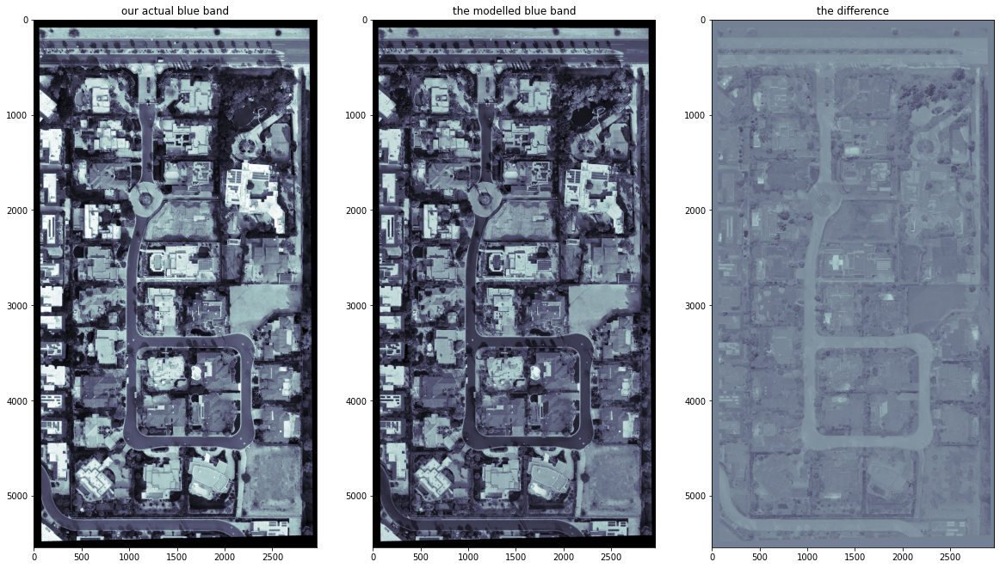

In [193]:
imageB_band = imageB[:,:,2]

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageB_band, cmap='bone');axs[0].set_title('our actual blue band')
axs[1].imshow(imageB_model, cmap='bone');axs[1].set_title('the modelled blue band')
axs[2].imshow(imageB_band-imageB_model, cmap='bone');axs[2].set_title('the difference')

Very Cool. Now lets rebuild the RGB image and see what that would look like. 

Text(0.5, 1.0, 'blue as the average of red and green')

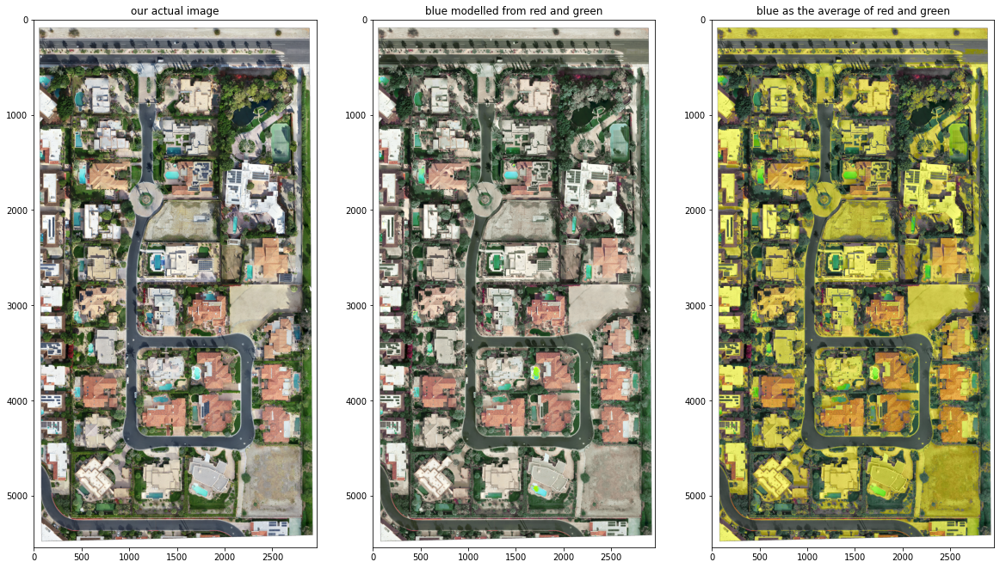

In [199]:
imageRGB_model = imageRGB.copy()
imageRGB_model[:,:,2] = imageB_model

imageRGG = imageRGB.copy()
imageRGG[:,:,2] = (imageRGB[:,:,1] + imageRGB[:,:,0])//2

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGB);axs[0].set_title('our actual image')
axs[1].imshow(imageRGB_model);axs[1].set_title('blue modelled from red and green')
axs[2].imshow(imageRGG);axs[2].set_title('blue as the average of red and green')

To illustrate that the model is indeed doing something intresting - I've added in a comparison computing blue as simply the average of red and green. As we can see the results are not quite as good! (I mean, its hardly a fair comparison.) We can certianly see that there is some bias in our results. Our trees are too blue. We can make impovements by increasing our sample size (that gas pedal), or selectively sampling our input intellegently based on our results and even regressing the whole process - meta learning. But lets go down that rabbit hole. Lets see how the model we computed performs on other data. 

Remember the inputs and outputs to the model are flattened arrays. Lets put this together in a function... 

In [0]:
def applyBlueModel(inRGB, blueModel):

  inRGB_flat = inRGB.reshape(-1, inRGB.shape[-1])

  inRG_flat = inRGB_flat[:,0:2]
  # inB_flat = inGB_flat[:,2] 

  outB_flat_model = blueModel.predict(inRG_flat)

  outB_model = outB_flat_model.reshape(inRGB.shape[0:2])

  outRGB = inRGB.copy()
  outRGB[:,:,2] = outB_model

  return outRGB

Text(0.5, 1.0, 'modelled 2')

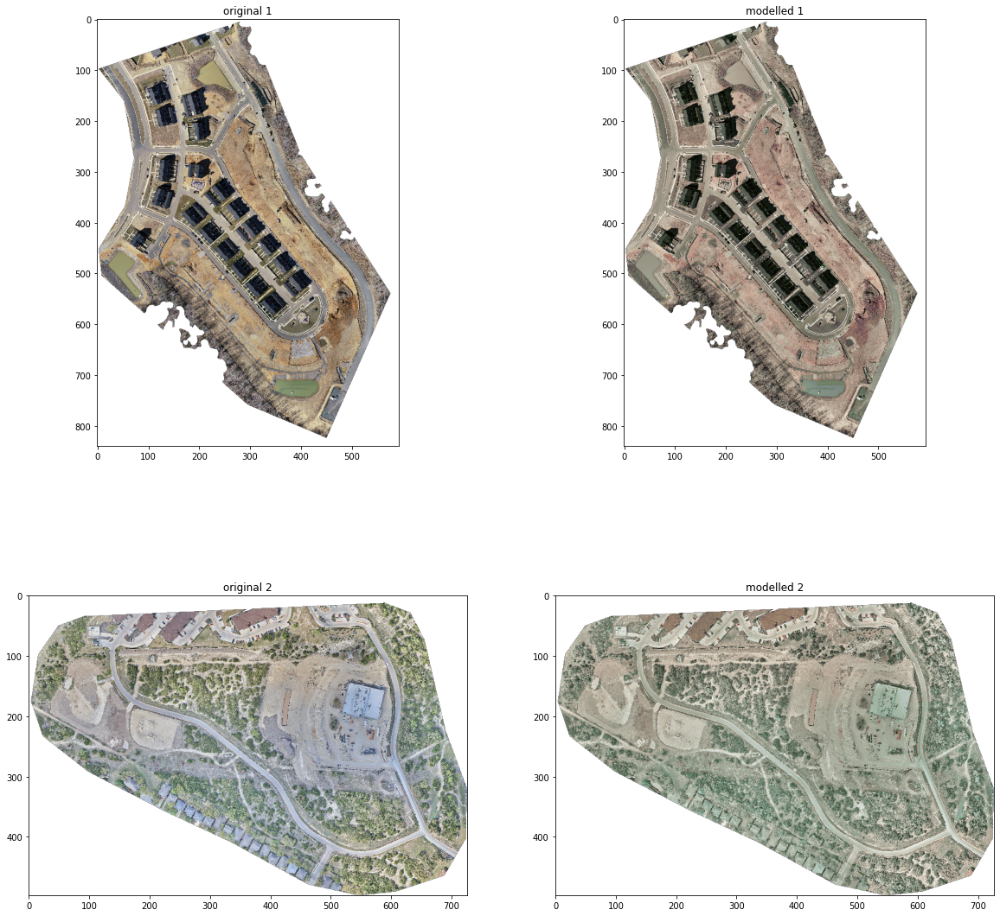

In [216]:
imageRGB_2 = imageio.imread(imageInfo.iloc[2].path_image)[::10,::10]
imageRGB_2_model = applyBlueModel(imageRGB_2, blueModel)

imageRGB_1 = imageio.imread(imageInfo.iloc[1].path_image)[::10,::10]
imageRGB_1_model = applyBlueModel(imageRGB_1, blueModel)

fig, axs = plt.subplots(2, 2)
axs[0,0].imshow(imageRGB_1);axs[0,0].set_title('original 1')
axs[0,1].imshow(imageRGB_1_model);axs[0,1].set_title('modelled 1')
axs[1,0].imshow(imageRGB_2);axs[1,0].set_title('original 2')
axs[1,1].imshow(imageRGB_2_model);axs[1,1].set_title('modelled 2')

So our results are mixed. Atleast a tad intersting. We did apply random forest regression to develop these blue values. We could certinly spend time tracking down a better solution. But - at some level you have to also consider - can you compute blue from red and green? Well no. Not without some severly complex contextually aware deep neural network trained by a fair bit of data. Even still - it is the edge cases which we will continue to have trouble with.

We *should* certainly be diving into some of the tools for [assessing the success of our model](https://scikit-learn.org/stable/modules/model_evaluation.html) - but in the interest of brevity - lets move onto to classificaiton! 

#Formatting the Data for Classification

Ok! Lets remove those blinders and remember the other image types we have access to - speficically labels. These are an example of the type of training data which can be useful in perfoming classification type modelling. Here we will be using the a very similarly formatted tool in the GBDT family, the [Gradient Boosting Classifier](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html). And just like the regression variant - it expects a 2-D array of **n** x attributes trained to a 1-d arrays of **n**, in this case, labels. So lets take a quick peak at one of our label arrays. 

In [219]:
reduction = 10

imagelabel = imageio.imread(imageInfo.iloc[0].path_label)[::reduction,::reduction,:]
imagelabel.shape

(555, 297, 3)

Oh no! As we suspected before our label images are stored as RGB images. Meaning that if are to use them as training data for GBDT - were going to have to do some image kung-fu to reduce them down to a 1-D array of samples. 

By snooping around the [github where we sources these images](https://github.com/dronedeploy/dd-ml-segmentation-benchmark)... we can find reference to a look up table (LUT) which would convert between color codes of the .png files we downloaded and single integers which would classification or labels. With this information, lets  establish a function to convert a 2-D array of RGB (3 values) to an integer representing classification codes (a single value)...

*forgive me this is not the most elegant or efficient of functions - here we explot numpy's [apply_along_axis](https://docs.scipy.org/doc/numpy/reference/generated/numpy.apply_along_axis.html) function*

In [0]:
lut_rgb = {(255, 0, 255) : 0,
        (230, 25, 75) : 1,
        (145, 30, 180) : 2,
        (60, 180, 75) : 3,
        (245, 130,48) : 4,
        (255, 255, 255) : 5,
        (0,130,200) : 6}

def rgb2label(rgb_array):
  def indexLUT(rgb_array):
    return lut_rgb[tuple(rgb_array)]
  label_array = np.apply_along_axis(indexLUT, 2, rgb_array)
  return label_array

And lets give it a try...

In [229]:
imagelabel_value = rgb2label(imagelabel)
imagelabel_value.shape

(555, 297)

Great! We have a single value now which we can flatten to a 1-D array as we did before for our blue array. For the sake of using their 'nice' colors in viewing our classification results - lets create a funcion that can compute similar RGB from classification code integers as well...

*Here we will use the numpy [take](https://docs.scipy.org/doc/numpy/reference/generated/numpy.take.html) function - please note this particular implementation only works because the label values listed sequentially 0 to 6*

In [0]:
lut_label =np.array([[255, 0, 255],
      [230, 25, 75],
      [145, 30, 180],
      [60, 180, 75],
      [245, 130,48],
      [255, 255, 255],
      [0,130,200]])

def label2rgb(label_array):
  rgb_array = np.zeros(label_array.shape + (3,), dtype=np.uint8)
  rgb_array = np.take(lut_label, label_array, axis=0, out=rgb_array)

  return rgb_array

Just to note, these label values in order from 0 to 6, correspond to the following classifications:

In [0]:
class_names = ['IGNORE', 'BUILDING', 'CLUTTER', 'VEGETATION', 'WATER', 'GROUND', 'CAR']

Lets test that as well and have a look...

In [234]:
imagelabel_test = label2rgb(imagelabel_value)
imagelabel_test.shape

(555, 297, 3)

Text(0.5, 1.0, 'reconstructed RGB label test')

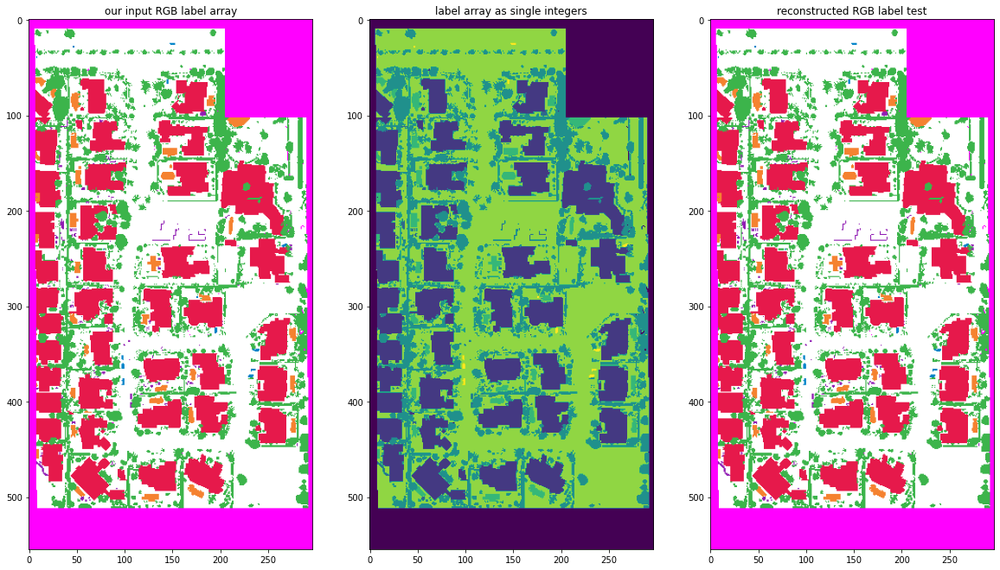

In [236]:
fig, axs = plt.subplots(1, 3)
axs[0].imshow(imagelabel);axs[0].set_title('our input RGB label array')
axs[1].imshow(imagelabel_value);axs[1].set_title('label array as single integers')
axs[2].imshow(imagelabel_test);axs[2].set_title('reconstructed RGB label test')

Very good! Now the last step was not essential for running the classification model but its good practice for applying LUTs to single band integer numpy arrays to control the colors. Lets continue! Lets follow a similar process as before to prepare the flattened datasets for feeding to the GBDT training model though this time we will be flattening two images - the otrho image to form a 2-D **n***attribute model input and the label grid to form a 1-D **n** length array as a model target. Lets do that now and confirm that their dimensions are correct... 

In [264]:
imageRGBA = imageio.imread(imageInfo.iloc[0].path_image)[::reduction,::reduction,:]
imageRGB = imageRGBA[:,:,0:3]
imageRGB_flat = imageRGB.reshape(-1, imageRGB.shape[-1])

imagelabel_value_flat = imagelabel_value.flatten()

imageRGB_flat_subsample = imageRGB_flat[::100]
imagelabel_value_flat_subsample = imagelabel_value_flat[::100]

print(imageRGB_flat.shape)
print(imagelabel_value_flat.shape)

(164835, 3)
(164835,)


Great! Now we should be able to feed them to the GBDT classifier!

In [274]:
from sklearn.ensemble import GradientBoostingClassifier
clf = GradientBoostingClassifier(n_estimators=1000, learning_rate=0.01,
                                 max_depth=1, random_state=0,verbose=1).fit(imageRGB_flat_subsample, imagelabel_value_flat_subsample)

      Iter       Train Loss   Remaining Time 
         1        2297.2159           19.54s
         2        2285.9120           16.01s
         3        2275.0169           14.22s
         4        2264.5064           13.11s
         5        2254.3533           12.49s
         6        2244.5394           12.07s
         7        2235.0411           11.75s
         8        2225.8451           11.48s
         9        2216.9331           11.29s
        10        2208.2866           11.16s
        20        2134.0966           10.59s
        30        2075.8227           10.25s
        40        2028.7816            9.94s
        50        1989.8196            9.82s
        60        1957.0610            9.63s
        70        1928.1769            9.46s
        80        1903.4405            9.43s
        90        1881.6894            9.28s
       100        1862.6025            9.12s
       200        1754.9753            7.98s
       300        1707.9803            6.98s
       40

Lets reconstruct our 2-D arrays and inspect the results of out model visually...


Text(0.5, 1.0, 'reconstructed RGB label test')

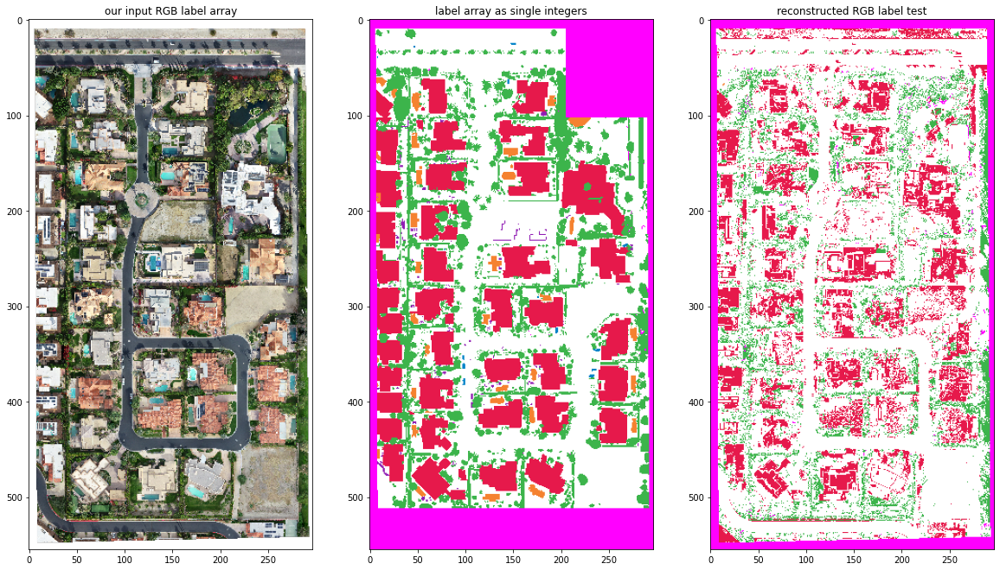

In [303]:
imagelabel_value_flat_model = clf.predict(imageRGB_flat)
plt.rcParams['figure.figsize'] = [20, 20]
inshape = imageRGB.shape
imagelabel_value_model = imagelabel_value_flat_model.reshape(inshape[0:2])
imagelabel_model = label2rgb(imagelabel_value_model)

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('our input RGB label array')
axs[1].imshow(imagelabel);axs[1].set_title('label array as single integers')
axs[2].imshow(imagelabel_model);axs[2].set_title('reconstructed RGB label test')


Now - this is a very simple and nieve model run for very few iterations. But these coarse results do show that some connection between the input and target data are being made. Lets take a look at the [confusion matrix](https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html#sphx-glr-auto-examples-model-selection-plot-confusion-matrix-py) using the sklearn library. 

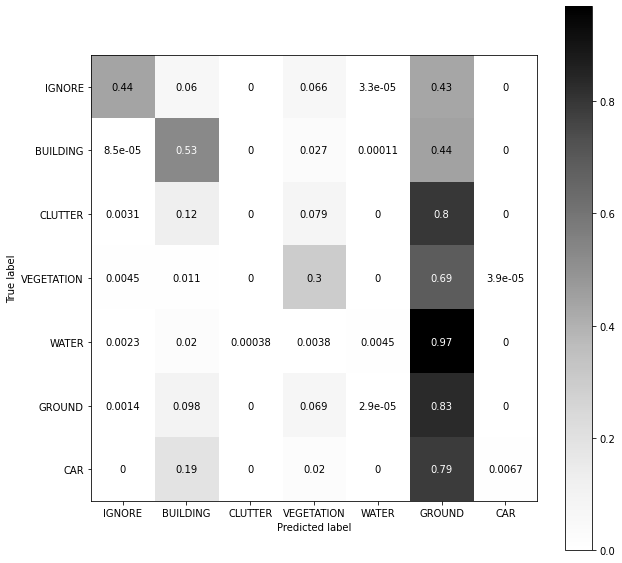

In [343]:
from sklearn.metrics import plot_confusion_matrix
plt.rcParams['figure.figsize'] = [10, 10] #lets reduce the plot size a little 
plot_confusion_matrix(clf, imageRGB_flat, imagelabel_value_flat, display_labels=class_names,cmap='Greys',
                                 normalize='true')



To interpret this - we look down the row for each  true value. We then read across the plot to see what percentage of each class ended up in each class in the model. Ideally, all predicted classes would 100% reside in the true label (forming a solid diagonal). 

We can see from our plot that a significant amount of classes are being classified as ground. Again, there are several ways we can address this problem. 
* Decreasing the model learning rate and/or Increasing the model interations
* Adding more control data
* Modifying the input value subsampling
* Including additional attributes - like elevation. 

Lets forgo playing with the first option - it can be a bit of a time sink (though, some [sophisticated techniques](https://scikit-learn.org/stable/modules/grid_search.html#grid-search) exist to help with model selection and refinement)

For brevity - lets also avoid downloading the larger image dataset and deploying these models on larger datasets. But know that this the go-to apporach for machine learning when resources like data and compute time are available. 

Lets take a look at the last two options.  
##Modifying the input value subsampling

Text(0.5, 1.0, 'class after subsample')

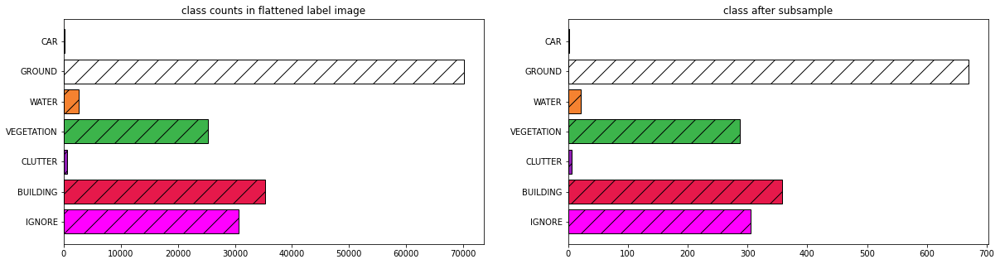

In [410]:
plt.rcParams['figure.figsize'] = [20, 20]

fig, ax = plt.subplots(1,2)
fig.set_figheight(5)

labels, counts = np.unique(imagelabel_value_flat,return_counts=True)
ax[0].barh(labels, counts,edgecolor ='xkcd:black',linewidth =1, color=lut_label/255,hatch="/")
ax[0].set_yticks(np.arange(len(class_names)))
ax[0].set_yticklabels(class_names)
ax[0].set_title('class counts in flattened label image')

labels, counts = np.unique(imagelabel_value_flat_subsample,return_counts=True)
ax[1].barh(labels, counts,edgecolor ='xkcd:black',linewidth =1, color=lut_label/255,hatch="/")
ax[1].set_yticks(np.arange(len(class_names)))
ax[1].set_yticklabels(class_names)
ax[1].set_title('class after subsample')


Text(0.5, 1.0, 'class counts after new subsample')

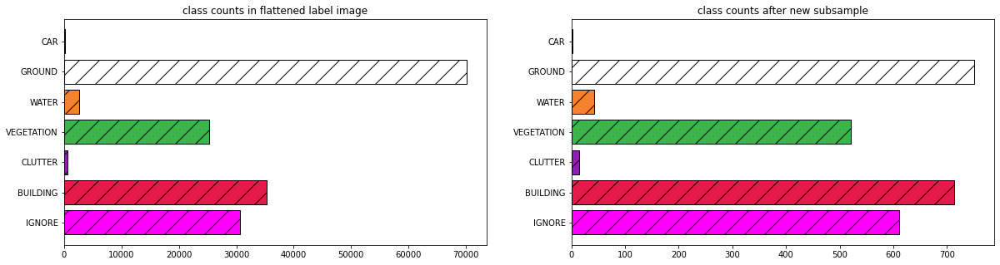

In [411]:
targetArrays = []
inputArrays = []
reduction = 50 
count = 750

for label in labels:
  labelSubset = imagelabel_value_flat[::reduction][imagelabel_value_flat[::reduction]==label][:count]
  # labelSubset = imagelabel_value_flat_subsample[imagelabel_value_flat_subsample==label][:count]
  targetArrays.append(labelSubset)
  featureSubset = imageRGB_flat[::reduction][imagelabel_value_flat[::reduction]==label,:][:count,:]
  # featureSubset = imageRGB_flat_subsample[imagelabel_value_flat_subsample==label,:][:count,:]
  inputArrays.append(featureSubset)

imageRGB_flat_subsample2 = np.vstack(inputArrays)
imagelabel_value_flat_subsample2 = np.hstack(targetArrays)

fig, ax = plt.subplots(1,2)
fig.set_figheight(5)

labels, counts = np.unique(imagelabel_value_flat,return_counts=True)
ax[0].barh(labels, counts,edgecolor ='xkcd:black',linewidth =1, color=lut_label/255,hatch="/")
ax[0].set_yticks(np.arange(len(class_names)))
ax[0].set_yticklabels(class_names)
ax[0].set_title('class counts in flattened label image')

labels, counts = np.unique(imagelabel_value_flat_subsample2,return_counts=True)
ax[1].barh(labels, counts,edgecolor ='xkcd:black',linewidth =1, color=lut_label/255,hatch="/")
ax[1].set_yticks(np.arange(len(class_names)))
ax[1].set_yticklabels(class_names)
ax[1].set_title('class counts after new subsample')


In [463]:
from sklearn.ensemble import GradientBoostingClassifier
clf2 = GradientBoostingClassifier(n_estimators=1000, learning_rate=0.01,
                                 max_depth=1, random_state=0,verbose=1).fit(imageRGB_flat_subsample2, imagelabel_value_flat_subsample2)

      Iter       Train Loss   Remaining Time 
         1        3886.2178           17.10s
         2        3868.0200           16.08s
         3        3850.3767           15.72s
         4        3833.2592           15.32s
         5        3816.6414           15.09s
         6        3800.4980           14.90s
         7        3784.8087           14.86s
         8        3769.5639           14.91s
         9        3754.7288           16.50s
        10        3740.2671           16.58s
        20        3613.6473           15.05s
        30        3511.7980           14.54s
        40        3427.3529           14.34s
        50        3356.5933           13.94s
        60        3296.5723           13.69s
        70        3244.9228           13.37s
        80        3200.3067           13.23s
        90        3161.3782           13.10s
       100        3127.7711           12.96s
       200        2936.5759           11.18s
       300        2853.1844            9.72s
       40

Text(0.5, 1.0, 'reconstructed RGB label test')

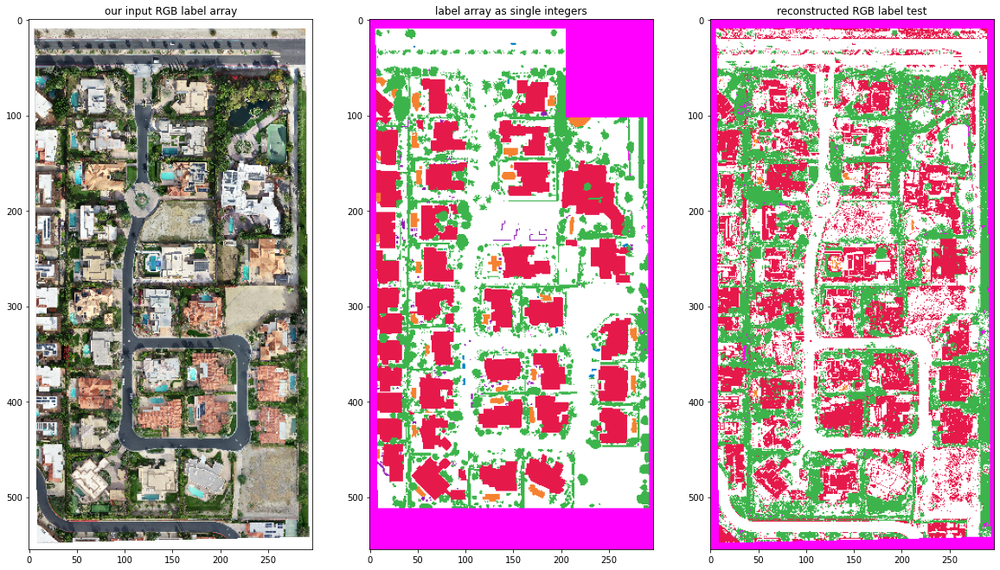

In [464]:
imagelabel_value_flat_model = clf2.predict(imageRGB_flat)

inshape = imageRGB.shape
imagelabel_value_model = imagelabel_value_flat_model.reshape(inshape[0:2])
imagelabel_model = label2rgb(imagelabel_value_model)

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('our input RGB label array')
axs[1].imshow(imagelabel);axs[1].set_title('label array as single integers')
axs[2].imshow(imagelabel_model);axs[2].set_title('reconstructed RGB label test')

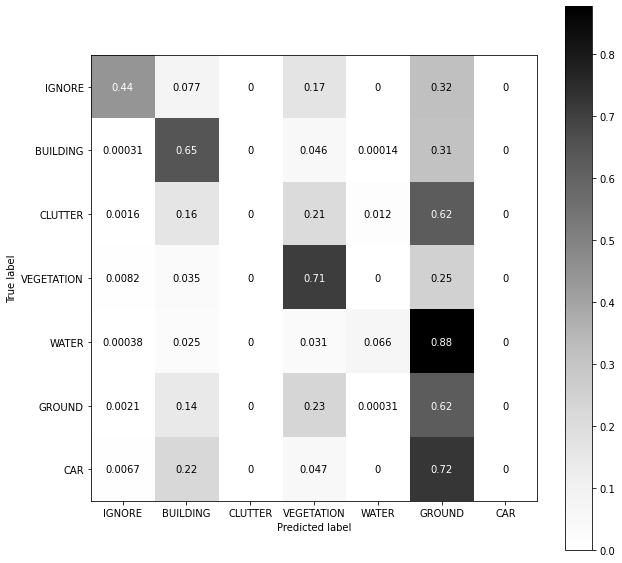

In [414]:
from sklearn.metrics import plot_confusion_matrix
plt.rcParams['figure.figsize'] = [10, 10] #lets reduce the plot size a little 
plot_confusion_matrix(clf, imageRGB_flat, imagelabel_value_flat, display_labels=class_names,cmap='Greys',
                                 normalize='true')

##Including additional attributes - elevation

Text(0.5, 1.0, 'reconstructed RGB label test')

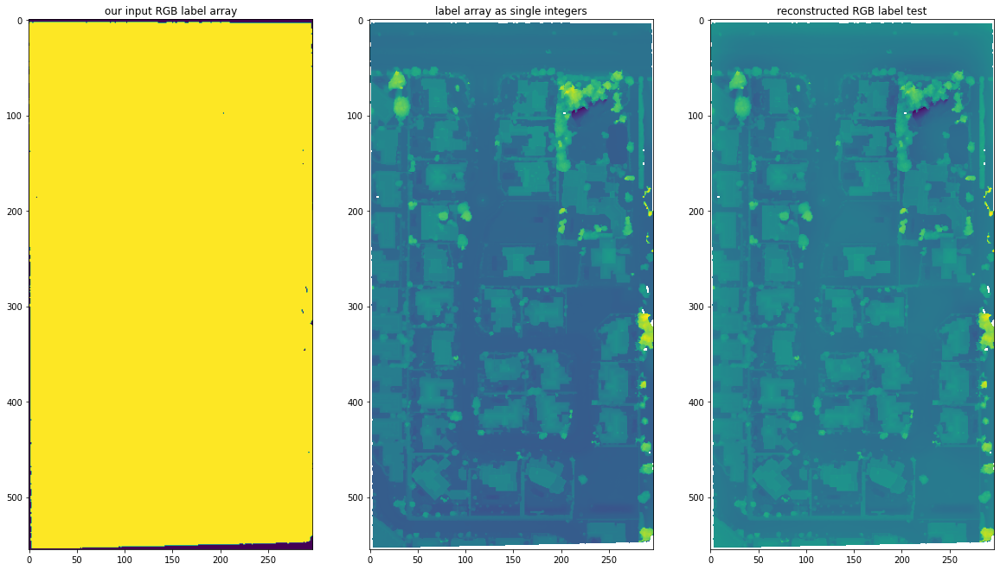

In [434]:
reduction=10
array_elevation32 = imageio.imread(imageInfo.iloc[0].path_elevation)[::reduction,::reduction]
array_elevation32_nan = array_elevation32.copy()
array_elevation32_nan[array_elevation32_nan==-32767.0] = np.nan


from astropy.convolution import convolve
from astropy.convolution import Gaussian2DKernel
kernel = Gaussian2DKernel(x_stddev=20)
array_elevation32_norm = convolve(array_elevation32_nan, kernel)
array_elevation32_norm -= array_elevation32_nan
array_elevation32_norm = -array_elevation32_norm

fig, axs = plt.subplots(1, 3)
axs[0].imshow(array_elevation32);axs[0].set_title('our input RGB label array')
axs[1].imshow(array_elevation32_nan);axs[1].set_title('label array as single integers')
axs[2].imshow(array_elevation32_norm);axs[2].set_title('reconstructed RGB label test')

In [438]:
reduction = 10

# imageRGBA = imageio.imread(imageInfo.iloc[0].path_image)[::reduction,::reduction,:]

array_elevation32_nan_norm = array_elevation32_nan.copy()
array_elevation32_nan_norm -= np.nanmin(array_elevation32_nan)
array_elevation32_nan_norm /= np.nanmax(array_elevation32_nan_norm)
array_elevation8 = array_elevation32_nan_norm*255
array_elevation8 = array_elevation8.astype(np.uint8) 

imageRGBE = imageRGBA.copy()

# imageRGBE[:,:,3] = array_elevation8
# plt.imshow(imageRGBE)

imageRGBE_flat = imageRGBE.reshape(-1, imageRGBE.shape[-1])

imagelabel_value_flat = imagelabel_value.flatten()

imageRGBE_flat_subsample = imageRGBE_flat[::100]
imagelabel_value_flat_subsample = imagelabel_value_flat[::100]

print(imageRGBE_flat.shape)
print(imagelabel_value_flat.shape)

(164835, 4)
(164835,)


In [455]:
from sklearn.ensemble import GradientBoostingClassifier
clf3 = GradientBoostingClassifier(n_estimators=5000, learning_rate=.1,
                                 max_depth=1, random_state=0,verbose=1).fit(imageRGBE_flat_subsample, imagelabel_value_flat_subsample)

      Iter       Train Loss   Remaining Time 
         1        2197.2155            1.44m
         2        2120.4842            1.16m
         3        2061.3584            1.06m
         4        2015.3927            1.00m
         5        1976.7909           58.21s
         6        1945.8126           56.92s
         7        1915.7165           55.74s
         8        1892.7890           54.89s
         9        1870.8023           54.35s
        10        1854.1164           54.02s
        20        1749.0079           52.28s
        30        1703.5101           51.96s
        40        1675.3357           52.02s
        50        1653.8427           51.25s
        60        1636.4764           50.97s
        70        1620.9102           51.57s
        80        1606.8778           51.33s
        90        1594.2705           51.34s
       100        1582.3122           50.94s
       200        1496.5865           49.46s
       300        1445.2975           48.23s
       40

Text(0.5, 1.0, 'reconstructed RGB label test')

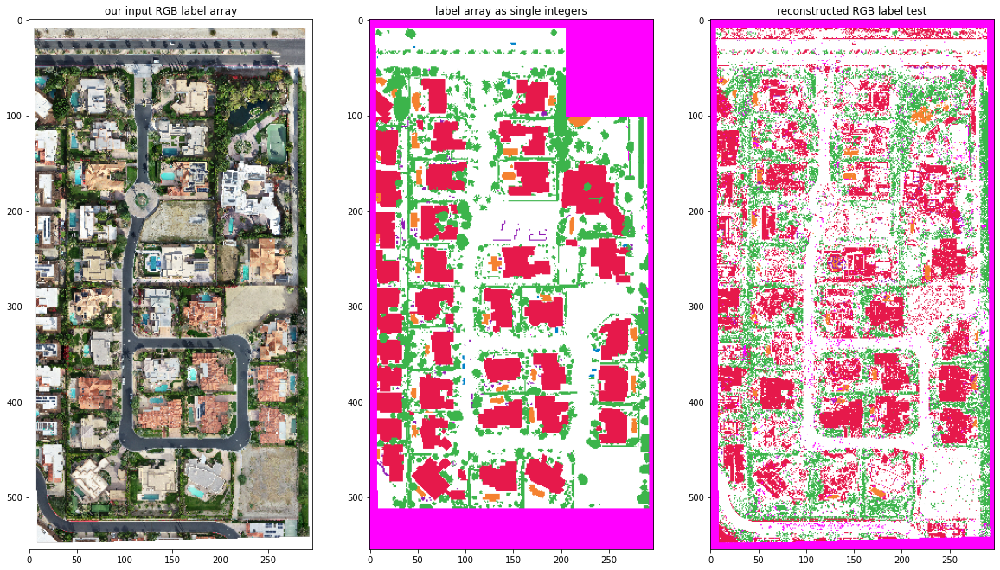

In [456]:
imagelabel_value_flat_model_elevation = clf3.predict(imageRGBE_flat)

inshape = imageRGB.shape
imagelabel_value_model_elevation = imagelabel_value_flat_model_elevation.reshape(inshape[0:2])
imagelabel_model_elevation = label2rgb(imagelabel_value_model_elevation)

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('our input RGB label array')
axs[1].imshow(imagelabel);axs[1].set_title('label array as single integers')
axs[2].imshow(imagelabel_model_elevation);axs[2].set_title('reconstructed RGB label test')

Lets use ndimage to apply a [median filter](https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.median_filter.html)

Text(0.5, 1.0, 'reconstructed RGB label test')

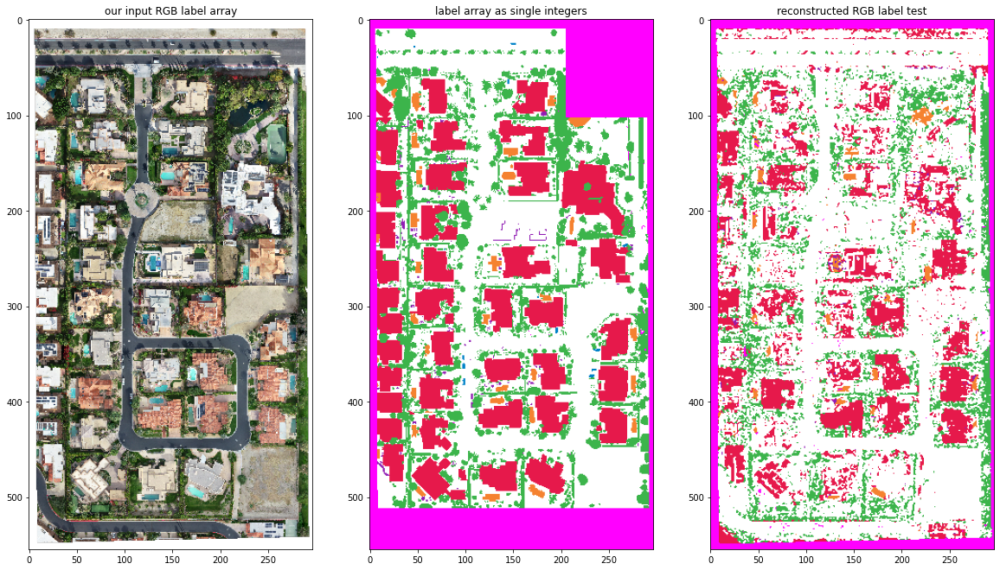

In [458]:
plt.rcParams['figure.figsize'] = [20, 20]

from scipy import ndimage
imagelabel_value_model_elevation_median = ndimage.median_filter(imagelabel_value_model_elevation, size=2)
imagelabel_model_elevation_median = label2rgb(imagelabel_value_model_elevation_median)

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('our input RGB label array')
axs[1].imshow(imagelabel);axs[1].set_title('label array as single integers')
axs[2].imshow(imagelabel_model_elevation_median);axs[2].set_title('reconstructed RGB label test')


To go beyond this, we could add a truly unlimited number of additioal attributes by computing an edless list of features from our images and elevation models! We could focus on texture metrics such as [local binary pattern](https://scikit-image.org/docs/dev/auto_examples/features_detection/plot_local_binary_pattern.html) or computing [segments and superpixels](https://scikit-image.org/docs/stable/auto_examples/segmentation/plot_segmentations.html#sphx-glr-auto-examples-segmentation-plot-segmentations-py) - BUT - we would be working very hard to perform an exhaustive analysis which would be appraching toward what convolutional neural networks (CNN) and their segmentation counterparts [UNETS](https://github.com/bigmb/Unet-Segmentation-Pytorch-Nest-of-Unets) do! They iterare over a series of image filters much like we would create image derivatives and feed them to the GBDT classifer we used here. Lets stop there but consider some bonus material...

##Bonus Material 

1. Simply go back and try and rerun some of those models and see if you can get some better results! They can run for a looong time if you set them up to!

2. This tutorial is meant to get us down and first with image processing to prepare data to fit a reasonably good general model for performing regressions and classifications. However, the results shown in the gitHub where these data were aquired from show much better results! For one - they train on the larger dataset - but they also use more specifically tailored image classification machine learning tools such as pretrained convolutional neural nets ([resnet-18](https://supervise.ly/explore/models/res-net-18-image-net-2717/overview)) Even using the rather high level [karas library](https://keras.io/), setting these tools up to work for segmentation tasks such as this can be [rather complex](https://github.com/dronedeploy/dd-ml-segmentation-benchmark/blob/master/libs/models_keras.py) for a tutorial such as this - but we can pull and run their git! As a bonus - consider attepting to pull [that gitRepo](https://github.com/dronedeploy/dd-ml-segmentation-benchmark), and run the karas model on the sample data set! (No Pressure! - something to consider!)

In [0]:
#class sampling
row = imageInfo.iloc[1]
print(row)

reduction = 100
count = 50

import imageio
array_label = imageio.imread(row.path_labels)[::reduction,::reduction,:]
array_label = np.apply_along_axis(rgb2index, 2, array_label)
# array_label_flat = array_label.reshape(-1, array_label.shape[-1])

array_label_flat = array_label.flatten()
array_image = tifffile.imread(row.path_images)[::reduction,::reduction,:]
array_image_flat = array_image.reshape(-1, array_image.shape[-1])

labels, counts = np.unique(array_label,return_counts=True)

print(labels)
print(counts)
plt.bar(labels, counts)

targetArrays = []
inputArrays = []
for label in labels:
  # array_label_flat2 = array_label_flat.copy()
  labelSubset = array_label_flat[array_label_flat==label][:count]
  targetArrays.append(labelSubset)
  featureSubset = array_image_flat[array_label_flat==label,:][:count,:]
  inputArrays.append(featureSubset)

inputArray = np.vstack(inputArrays)
targetArray = np.hstack(targetArrays)